Set Animal IDs and Experiment IDs

In [1]:
data_path = "/Users/ryan.gorzek/Documents/Trachtenberg Lab/Data/Mapping_Through_Skull/"

exp_info = {
            "ctb01": {"exp_name": "20220603_101509", "rearing": "DR"}, 
            "ctb02": {"exp_name": "20220610_105811", "rearing": "DR"},
            "ctb07": {"exp_name": "20220711_135556", "rearing": "DR"},
            "ctb08": {"exp_name": "20220715_121356", "rearing": "DR"},
            "lt168": {"exp_name": "20220330_130327", "rearing": "DR"},
            "lt169": {"exp_name": "20220420_125809", "rearing": "DR"},
            "lt170": {"exp_name": "20220421_133932", "rearing": "DR"},
            "ctb03": {"exp_name": "20220623_161247", "rearing": "NR"},
            "ctb04": {"exp_name": "20220630_130119", "rearing": "NR"},
            "ctb05": {"exp_name": "20220706_105937", "rearing": "NR"},
            "ctb09": {"exp_name": "20220720_153020", "rearing": "NR"},
            "lt171": {"exp_name": "20220427_115917", "rearing": "NR"},
            "lt172": {"exp_name": "20220428_130342", "rearing": "NR"},
            "lt175": {"exp_name": "20220512_124014", "rearing": "NR"}
            }

Get User Input for Visual Area Boundaries on Sign Maps

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from tifffile import imread
from os.path import exists

# Choose visual areas for segmentation.
area_list = ["V1", "LM", "AL", "RL", "AM", "PM", "M"]

%matplotlib qt5
for ID,data in exp_info.items():
    # Load reference frame and sign map for segmenting
    exp_path = data_path + "{a}//{e}//".format(a=ID, e=data["exp_name"])
    data["refframe"] = imread(exp_path + "refframe.tif").squeeze()
    data["signmap"] = np.loadtxt(exp_path + "signmap.csv")
    # Create dictionary for storing visual area boundary coordinates.
    data["area_coords"] = dict(zip(area_list, [None]*len(area_list)))
    for area_num,area in enumerate(area_list):
        fig, ax = plt.subplots()
        ax.imshow(data["refframe"], cmap="gray")
        ax.imshow(data["signmap"], cmap="RdBu_r", clim=[-1,1], alpha=0.3)
        # Plot previously segmented areas to avoid selecting overlapping regions.
        if area_num > 0:
            for prev_area in area_list[:area_num]:
                ax.plot(data["area_coords"][prev_area][:,0], 
                        data["area_coords"][prev_area][:,1], 
                        color="k", linewidth=3)
        ax.set_title("Select Region for {ar}:".format(ar=area), fontsize=20)
        ax.axis("off")
        fig.set_size_inches(12, 12)
        # If segmentation coordinates are already saved for this area, use those.
        # Otherwise, get user input.
        if exists(exp_path + "{ar}.csv".format(ar=area)):
            data["area_coords"][area] = np.loadtxt(exp_path + "{ar}.csv".format(ar=area))
        else:
            curr_input = plt.ginput(n=-1, timeout=-1)
            curr_input = np.array(curr_input)
            curr_input = np.append(curr_input, [curr_input[0,:]], axis=0)
            data["area_coords"][area] = curr_input
            np.savetxt(exp_path + "{ar}.csv".format(ar=area), curr_input)
        plt.close()
    # Also load average magnitude, azimuth, and elevation data for downstream analyses.
    data["avg_mag"] = np.loadtxt(exp_path + "avg_mag.csv")*100
    data["azimuth"] = np.loadtxt(exp_path + "azimuth.csv")
    data["elevation"] = np.loadtxt(exp_path + "elevation.csv")

Plot Sign Map, Boundaries + Magnitude, Azimuth, and Elevation

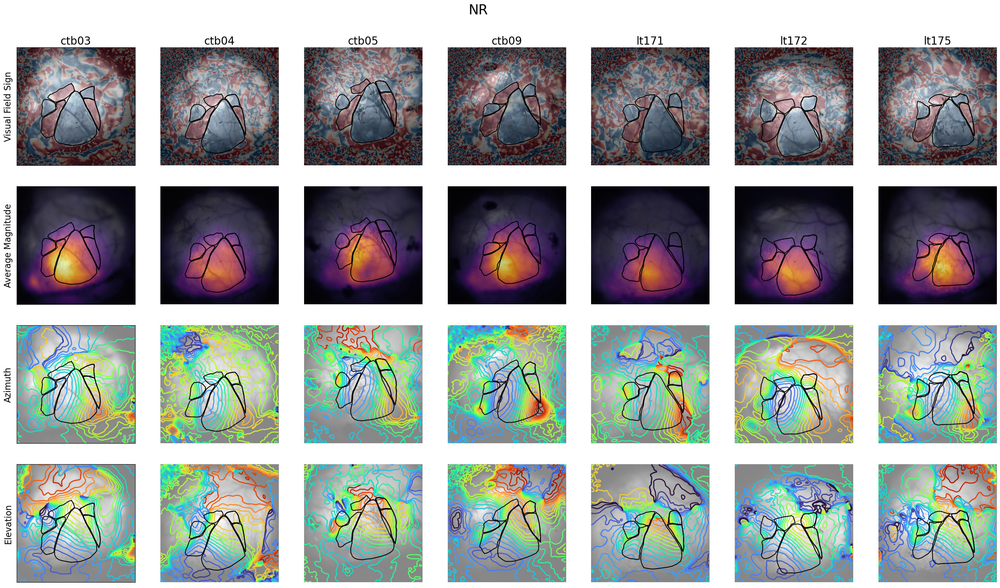

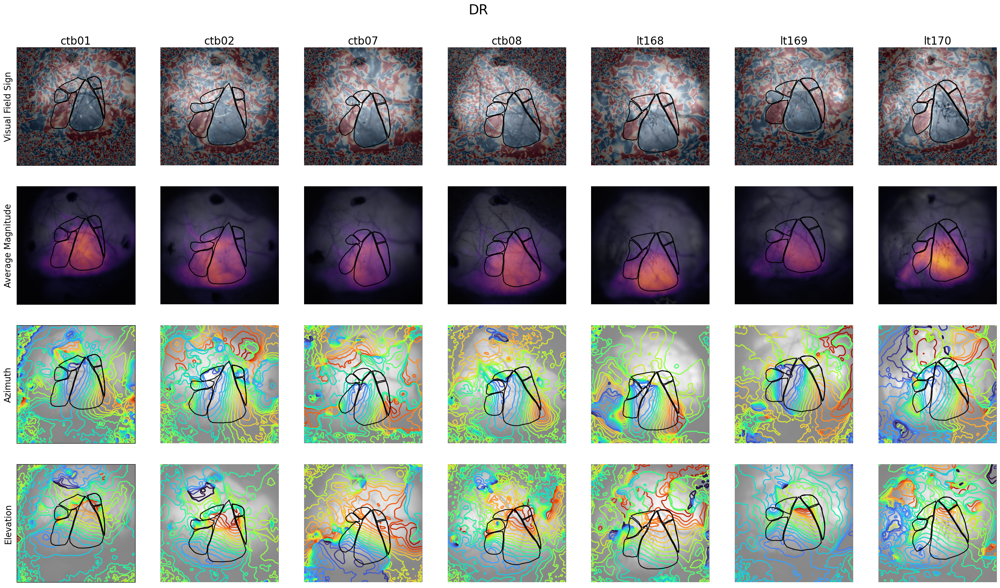

In [7]:
# Split exp_info into NR and DR groups.
%matplotlib inline
for condition in zip(["NR", "DR"], (7, 7), (28, 28)):
    fig, axs = plt.subplots(4, condition[1])
    col = -1
    for ID,data in exp_info.items():
        if data["rearing"] == condition[0]:
            col += 1
            # Sign map
            axs[0][col].imshow(data["refframe"], cmap="gray")
            axs[0][col].imshow(data["signmap"], cmap="RdBu_r", clim=[-1,1], alpha=0.3)
            axs[0][col].axis("off")
            axs[0][col].set_title(ID, fontsize=20)
            # Average magnitude
            axs[1][col].imshow(data["refframe"], cmap="gray")
            axs[1][col].imshow(data["avg_mag"], cmap="inferno", clim=[0,5], alpha=0.7)
            axs[1][col].axis("off")
            # Azimuth
            axs[2][col].imshow(data["refframe"], cmap="gray", alpha=0.5)
            axs[2][col].contour(data["azimuth"], levels=np.arange(0, 144, 7.5), cmap='turbo_r', alpha=1, linewidths=2)
            axs[2][col].axis("off")
            # Elevation
            axs[3][col].imshow(data["refframe"], cmap="gray", alpha=0.5)
            axs[3][col].contour(data["elevation"], levels=np.arange(0, 100, 5), cmap='turbo_r', alpha=1, linewidths=2)
            axs[3][col].axis("off")
            # Area boundaries
            for area in area_list:
                for plot_num in range(4):
                    axs[plot_num][col].plot(data["area_coords"][area][:,0], data["area_coords"][area][:,1], color="k")
            # Row labels
            if col == 0:
                for lbl_num,lbl in enumerate(["Visual Field Sign", "Average Magnitude", "Azimuth", "Elevation"]):
                    axs[lbl_num][col].axis("on")
                    axs[lbl_num][col].set_xticks([])
                    axs[lbl_num][col].set_xticklabels([])
                    axs[lbl_num][col].set_yticks([])
                    axs[lbl_num][col].set_yticklabels([])
                    axs[lbl_num][col].set_ylabel(lbl, fontsize=16)
    # Set figure parameters.
    fig.tight_layout(rect=[0, 0, 1, 1])
    fig.set_size_inches(condition[2], 16)
    fig.suptitle(condition[0], fontsize=25)
    fig.savefig(data_path + condition[0] + "_full.png", bbox_inches="tight")

Calculate Various Statistics for each Segmented Visual Area

In [3]:
import matplotlib.path as mplPath
import pandas as pd

def trim_map(input_array):
    """"""
    is_nan = np.isnan(input_array)
    row_idx = np.all(is_nan, axis=1)
    col_idx = np.all(is_nan, axis=0)
    output_array = np.delete(np.delete(input_array, row_idx, 0), col_idx, 1)
    return output_array

def calc_scatter(input_array, kernel):
    """"""
    scatter_array = np.full(input_array.shape, np.nan)
    for row in np.arange(2, input_array.shape[0] - 2, 1, dtype=int):
        row_idx = np.linspace(row - 2, row + 2, num=5, dtype=int)
        for col in np.arange(2, input_array.shape[1] - 2, 1, dtype=int):
            col_idx = np.linspace(col - 2, col + 2, num=5, dtype=int)
            idx = np.ix_(row_idx, col_idx)
            neighbor_mean = np.mean(input_array[idx] * kernel)
            scatter_array[row, col] = np.abs(input_array[idx][kernel == False] - neighbor_mean)
    return np.nanstd(scatter_array)

exp_stats = pd.DataFrame(columns=["ID", "rearing", "visual_area", "area", "signmap_std", "avg_mag", "avg_mag_norm", "az_scatter", "el_scatter", "az", "el"])

scatter_kernel = np.full((5, 5), True)
scatter_kernel[2, 2] = False

for ID,data in exp_info.items():
    for area in area_list:
        # print(ID + ", " + area)
        area_mask = np.full((512, 512), False)
        # Find points contained in current area boundary.
        area_path = mplPath.Path(data["area_coords"][area])
        for row in range(area_mask.shape[0]):
            for col in range(area_mask.shape[1]):
                area_mask[row, col] = area_path.contains_point([col, row], radius=0.001) or area_path.contains_point([col, row], radius=-0.001)
        # Area (fraction of pixels)
        area_frac = np.sum(area_mask, (0, 1))/np.prod(area_mask.shape)
        # Average magnitude
        avg_mag = np.nanmean(data["avg_mag"][area_mask])
        # Average magnitude (normalized to V1)
        if area == "V1":
            norm_area = avg_mag
        avg_mag_norm = avg_mag / norm_area
        # Visual field sign STD
        sm_masked = data["signmap"].copy()
        sm_masked[area_mask == False] = np.nan
        signmap_std = np.nanstd(sm_masked)
        # Scatter (azimuth)
        az_masked = data["azimuth"].copy()
        az_masked[area_mask == False] = np.nan
        az_scatter = calc_scatter(trim_map(az_masked), scatter_kernel)
        # Scatter (elevation)
        el_masked = data["elevation"].copy()
        el_masked[area_mask == False] = np.nan
        el_scatter = calc_scatter(trim_map(el_masked), scatter_kernel)
        # All azimuth values
        az = az_masked[area_mask]
        # All elevation values
        el = el_masked[area_mask]
        # Write everything to dataframe.
        exp_stats.loc[len(exp_stats.index)] = [ID, data["rearing"], area, area_frac*100, signmap_std, avg_mag, avg_mag_norm, az_scatter, el_scatter, az, el]

Draw Boxplot of Area, Avg. Magnitude, and Azimuth/Elevation Scatter

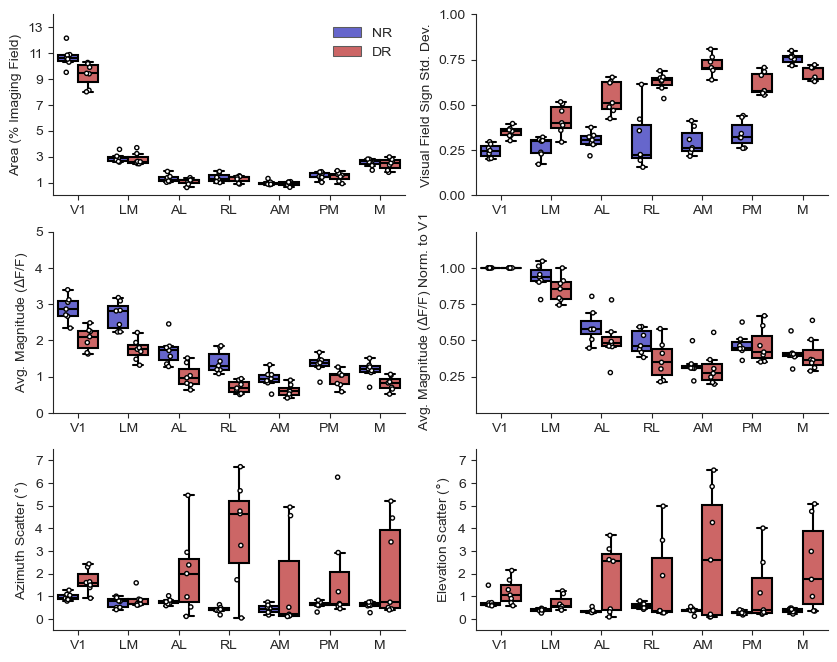

In [6]:
import seaborn as sb
%matplotlib inline
fig, axs = plt.subplots(3, 2)
plot_vars = [["area", "signmap_std"], ["avg_mag", "avg_mag_norm"], ["az_scatter", "el_scatter"]]
ylabs = [["Area (% Imaging Field)", "Visual Field Sign Std. Dev."], 
         ["Avg. Magnitude ($\Delta$F/F)", "Avg. Magnitude ($\Delta$F/F) Norm. to V1"], 
         ["Azimuth Scatter ($\xb0$)", "Elevation Scatter ($\xb0$)"]]
ylims = [[(0, 14), (0, 1)], [(0.25, 3.75), (0, 1.25)], [(-0.5, 7.5), (-0.5, 7.5)]]
yticks = [[np.linspace(1, 13, num=7), np.linspace(0, 1, num=5)], 
          [np.linspace(0, 5, num=6), np.linspace(0.25, 1, num=4)], 
          [np.linspace(0, 7, num=8), np.linspace(0, 7, num=8)]]
for plot_row in range(3):
    for plot_col in range(2):
        bx = sb.boxplot(
                        ax=axs[plot_row][plot_col],
                        data=exp_stats, 
                        x="visual_area", 
                        y=plot_vars[plot_row][plot_col],
                        hue="rearing",
                        hue_order=["NR", "DR"],
                        palette={"NR":(0.4, 0.4, 0.8), "DR":(0.8, 0.4, 0.4)},
                        saturation=1,
                        boxprops={"edgecolor":"k"},
                        fliersize=0
                        )
        plt.setp(axs[plot_row][plot_col].artists, edgecolor='k')
        plt.setp(axs[plot_row][plot_col].lines, color='k')
        sb.stripplot(
                     ax=axs[plot_row][plot_col],
                     data=exp_stats, 
                     x="visual_area", 
                     y=plot_vars[plot_row][plot_col],
                     hue="rearing", 
                     hue_order=["NR", "DR"], 
                     dodge=True,
                     palette={"NR":"w", "DR":"w"},
                     size=3,
                     linewidth=1,
                     edgecolor="k"
                    )
        if plot_row > 0 or plot_col > 0:
            axs[plot_row][plot_col].legend().remove()
        else:
            handles, labels = axs[plot_row][plot_col].get_legend_handles_labels()
            axs[plot_row][plot_col].legend(handles=handles[0:2], labels=labels[0:2], frameon=False)
        bx.set(xlabel="")
        bx.set(ylabel=ylabs[plot_row][plot_col])
        bx.set(ylim=ylims[plot_row][plot_col])
        bx.set_yticks(yticks[plot_row][plot_col])
        sb.despine()
        sb.set_style("ticks")
fig.set_size_inches(10, 8)
# fig.savefig(data_path + "mapping_stats.png", dpi=500, bbox_inches="tight")

Plot Histograms of Phase Representation in each Visual Area

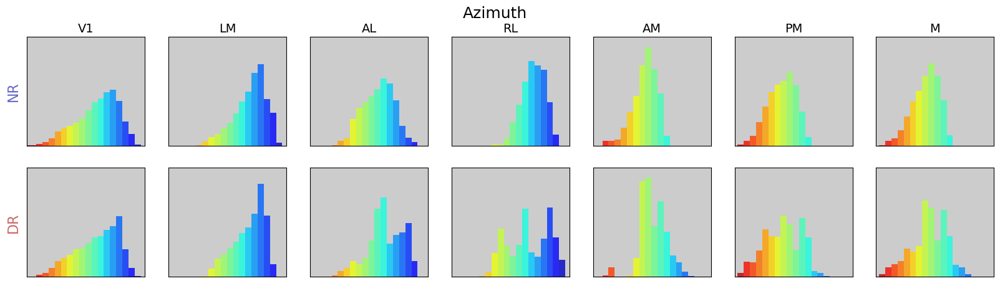

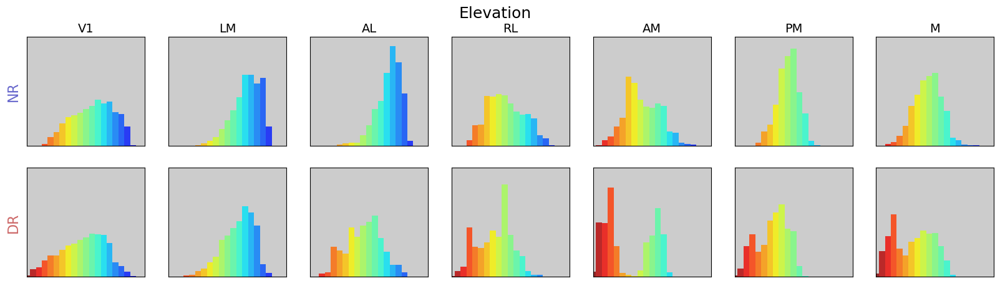

In [4]:
# Azimuth
%matplotlib inline
fig, axs = plt.subplots(2, 7)
for c_num, condition in enumerate(zip(["NR", "DR"], [(0.4,0.4,0.8), (0.8,0.4,0.4)])):
    for area_num, area in enumerate(area_list):
        exp_filt = exp_stats[(exp_stats.rearing == condition[0]) & (exp_stats.visual_area == area)]
        phases = exp_filt[["az"]].values
        all_phases = []
        for exp in phases:
            all_phases = np.concatenate((all_phases, exp[0]))
        hist_bins = np.arange(0., 1., 0.052)
        cmap = plt.cm.jet_r
        colors = cmap(hist_bins)
        hist, bin_edges = np.histogram(all_phases, np.arange(0, 144, 7.5))
        norm_hist = hist/np.sum(hist)
        axs[c_num][area_num].bar(bin_edges[:-1], norm_hist, color=colors, alpha=0.8, width=7.5)
        axs[c_num][area_num].set_xlim((0., 144.))
        axs[c_num][area_num].patch.set_facecolor((0.8, 0.8, 0.8))
        axs[c_num][area_num].grid(color="k")
        axs[c_num][area_num].set_xticks([])
        axs[c_num][area_num].set_xticklabels([])
        axs[c_num][area_num].set_yticks([])
        axs[c_num][area_num].set_yticklabels([])
        axs[c_num][area_num].set_ylim([0, 0.25])
        if area == "V1":
            axs[c_num][area_num].set_ylabel(condition[0], fontsize=16, color=condition[1])
        if condition[0] == "NR":
            axs[c_num][area_num].set_title(area, fontsize=14)
fig.suptitle("Azimuth", fontsize=18)
fig.set_size_inches(20, 5)
fig.savefig(data_path + "azimuth_hist.png", dpi=500, bbox_inches="tight")

# Elevation
fig, axs = plt.subplots(2, 7)
for c_num, condition in enumerate(zip(["NR", "DR"], [(0.4,0.4,0.8), (0.8,0.4,0.4)])):
    for area_num, area in enumerate(area_list):
        exp_filt = exp_stats[(exp_stats.rearing == condition[0]) & (exp_stats.visual_area == area)]
        phases = exp_filt[["el"]].values
        all_phases = []
        for exp in phases:
            all_phases = np.concatenate((all_phases, exp[0]))
        hist_bins = np.arange(0., 1., 0.05)
        cmap = plt.cm.jet_r
        colors = cmap(hist_bins)
        hist, bin_edges = np.histogram(all_phases, np.arange(0, 100, 5))
        norm_hist = hist/np.sum(hist)
        axs[c_num][area_num].bar(bin_edges[:-1], norm_hist, color=colors, alpha=0.8, width=5)
        axs[c_num][area_num].set_xlim((0., 100.))
        axs[c_num][area_num].patch.set_facecolor((0.8, 0.8, 0.8))
        axs[c_num][area_num].grid(color="k")
        axs[c_num][area_num].set_xticks([])
        axs[c_num][area_num].set_xticklabels([])
        axs[c_num][area_num].set_yticks([])
        axs[c_num][area_num].set_yticklabels([])
        axs[c_num][area_num].set_ylim([0, 0.25])
        if area == "V1":
            axs[c_num][area_num].set_ylabel(condition[0], fontsize=16, color=condition[1])
        if condition[0] == "NR":
            axs[c_num][area_num].set_title(area, fontsize=14)
fig.suptitle("Elevation", fontsize=18)
fig.set_size_inches(20, 5)
fig.savefig(data_path + "elevation_hist.png", dpi=500, bbox_inches="tight")

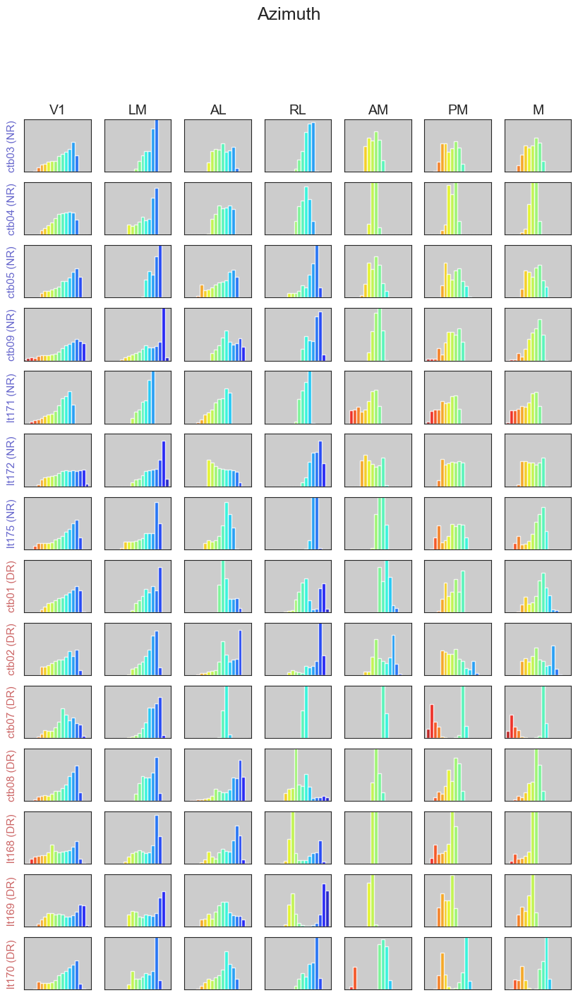

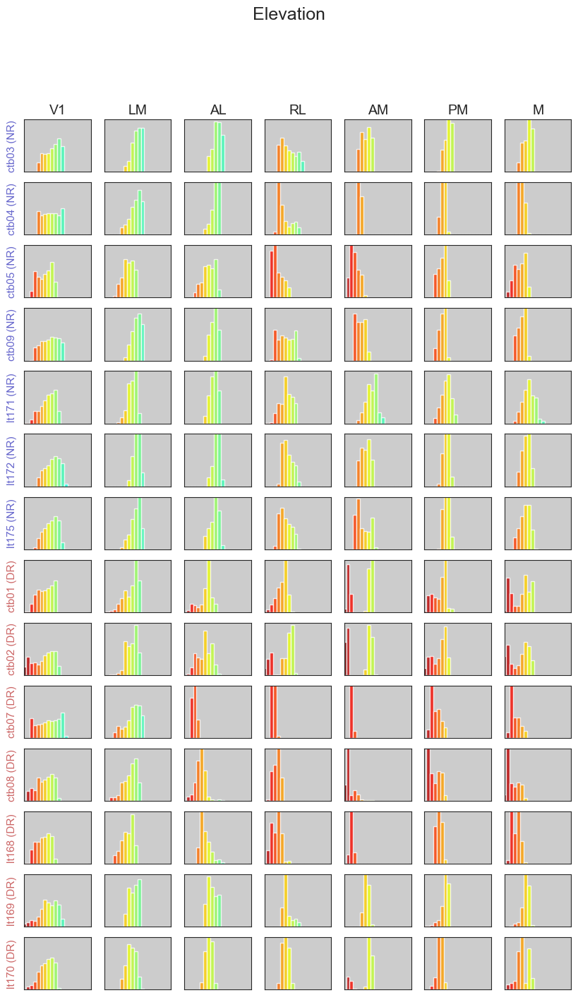

In [50]:
exp_ids = list(exp_info.keys())[7:] + list(exp_info.keys())[:7]
# Azimuth
%matplotlib inline
fig, axs = plt.subplots(14, 7)
for ID_num,ID in enumerate(exp_ids):
    for area_num, area in enumerate(area_list):
        exp_filt = exp_stats[(exp_stats.ID == ID) & (exp_stats.visual_area == area)]
        colors = [(0.4,0.4,0.8), (0.8,0.4,0.4)]
        condition_color = colors[["NR", "DR"].index(exp_filt["rearing"].tolist()[0])]
        phases = exp_filt[["az"]].values
        all_phases = []
        for exp in phases:
            all_phases = np.concatenate((all_phases, exp[0]))
        hist_bins = np.arange(0., 1., 0.052)
        cmap = plt.cm.jet_r
        colors = cmap(hist_bins)
        hist, bin_edges = np.histogram(all_phases, np.arange(0, 144, 7.5))
        norm_hist = hist/np.sum(hist)
        axs[ID_num][area_num].bar(bin_edges[:-1], norm_hist, color=colors, alpha=0.8, width=7.5)
        axs[ID_num][area_num].set_xlim((0., 144.))
        axs[ID_num][area_num].patch.set_facecolor((0.8, 0.8, 0.8))
        axs[ID_num][area_num].grid(color="k")
        axs[ID_num][area_num].set_xticks([])
        axs[ID_num][area_num].set_xticklabels([])
        axs[ID_num][area_num].set_yticks([])
        axs[ID_num][area_num].set_yticklabels([])
        axs[ID_num][area_num].set_ylim([0, 0.3])
        if area == "V1":
            axs[ID_num][area_num].set_ylabel(ID + " ({rr})".format(rr=exp_filt["rearing"].tolist()[0]), 
                                             fontsize=11, 
                                             color=condition_color)
        if ID_num == 0:
            axs[ID_num][area_num].set_title(area, fontsize=14)
fig.suptitle("Azimuth", fontsize=18)
fig.set_size_inches(10, 16)
fig.savefig(data_path + "azimuth_hist_all.png", dpi=500, bbox_inches="tight")

# Elevation
fig, axs = plt.subplots(14, 7)
for ID_num,ID in enumerate(exp_ids):
    for area_num, area in enumerate(area_list):
        exp_filt = exp_stats[(exp_stats.ID == ID) & (exp_stats.visual_area == area)]
        colors = [(0.4,0.4,0.8), (0.8,0.4,0.4)]
        condition_color = colors[["NR", "DR"].index(exp_filt["rearing"].tolist()[0])]
        phases = exp_filt[["el"]].values
        all_phases = []
        for exp in phases:
            all_phases = np.concatenate((all_phases, exp[0]))
        hist_bins = np.arange(0., 1., 0.052)
        cmap = plt.cm.jet_r
        colors = cmap(hist_bins)
        hist, bin_edges = np.histogram(all_phases, np.arange(0, 144, 7.5))
        norm_hist = hist/np.sum(hist)
        axs[ID_num][area_num].bar(bin_edges[:-1], norm_hist, color=colors, alpha=0.8, width=7.5)
        axs[ID_num][area_num].set_xlim((0., 144.))
        axs[ID_num][area_num].patch.set_facecolor((0.8, 0.8, 0.8))
        axs[ID_num][area_num].grid(color="k")
        axs[ID_num][area_num].set_xticks([])
        axs[ID_num][area_num].set_xticklabels([])
        axs[ID_num][area_num].set_yticks([])
        axs[ID_num][area_num].set_yticklabels([])
        axs[ID_num][area_num].set_ylim([0, 0.3])
        if area == "V1":
            axs[ID_num][area_num].set_ylabel(ID + " ({rr})".format(rr=exp_filt["rearing"].tolist()[0]), 
                                             fontsize=11, 
                                             color=condition_color)
        if ID_num == 0:
            axs[ID_num][area_num].set_title(area, fontsize=14)
fig.suptitle("Elevation", fontsize=18)
fig.set_size_inches(10, 16)
fig.savefig(data_path + "elevation_hist_all.png", dpi=500, bbox_inches="tight")